In [1]:
import scanpy as sc
import pandas as pd
import unitvelo as utv
import leidenalg
import scvelo as scv
scv.settings.verbosity = 0
import tensorflow as tf
print ("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
import cellrank as cr
import re
import numpy as np

(Running UniTVelo 0.1.6)
2022-05-30 11:21:07


2022-05-30 13:21:35.069387: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory


Num GPUs Available:  0


2022-05-30 13:23:27.240140: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-05-30 13:23:27.240198: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)


In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

In [17]:
plot_dir = "/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/"

# Gastrulation

Filtering and normalization is applied in the same vein to spliced/unspliced counts and X. Logarithmizing is only applied to X. If X is already preprocessed from former analysis, it will not be touched.

In [5]:
rna = sc.read_h5ad("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/old_anndata_rna.h5ad")
rna.layers["counts"] = rna.X.copy()

Since the data seems to be raw, we will normalize it and create a pca embedding. 

### Normalize and filter cells

In [8]:
sc.pp.normalize_total(rna, target_sum=1e4)
rna.raw = rna
# this function expects logarithmized data
sc.pp.highly_variable_genes(rna, min_mean=0.0125, max_mean=3, min_disp=0.5, n_top_genes = 2000, batch_key = "sample", layer = "counts", subset = True)


ValueError: cannot specify integer `bins` when input data contains infinity

In [9]:
sc.pp.regress_out(rna, ['nCount_RNA', 'mitochondrial_percent_RNA'])
sc.pp.scale(rna, max_value=10)

KeyboardInterrupt: 

In [ ]:
sc.tl.pca(rna, svd_solver='arpack')
#sc.pp.neighbors(rna, n_neighbors=10, n_pcs=30)
sc.pp.neighbors(rna, n_pcs=20, knn=True, n_neighbors=15, method="umap")

In [ ]:
for i in [0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]:
    sc.tl.leiden(rna,resolution =i)
    sc.tl.paga(rna)
    sc.pl.paga(rna, plot=False)
    sc.tl.umap(rna, init_pos="paga")
    sc.pl.umap(rna, color = "celltype.mapped", size = 10, title = f"clustering resolution = {i}")

In [ ]:
sc.tl.leiden(rna,resolution =0.5)
sc.tl.paga(rna)
sc.pl.paga(rna, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.pp.regress_out(rna, ['nCount_RNA', 'mitochondrial_percent_RNA'])
sc.pp.scale(rna, max_value=10)
sc.tl.umap(rna, init_pos='paga')

In [7]:
sc.pl.umap(rna, color = "celltype.mapped", size = 12, title = "resolution = 0.5")

KeyError: "Could not find 'umap' or 'X_umap' in .obsm"

In [ ]:
scv.pl.proportions(rna)


In [ ]:
label = 'celltype.mapped'

### Select cells of Eryhtroid lineage

In [ ]:
blood = rna[rna.obs["celltype.mapped"].isin(["Blood_progenitors_1", "Blood_progenitors_2", "Erythroid1", "Erythroid2", "Erythroid3", "Haematoendothelial_progenitors", "Endothelium"]),] 

scores

In [10]:
blood =  sc.read_h5ad("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/blood_lineage.h5ad")
blood_copy =  sc.read_h5ad("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/blood_lineage.h5ad")

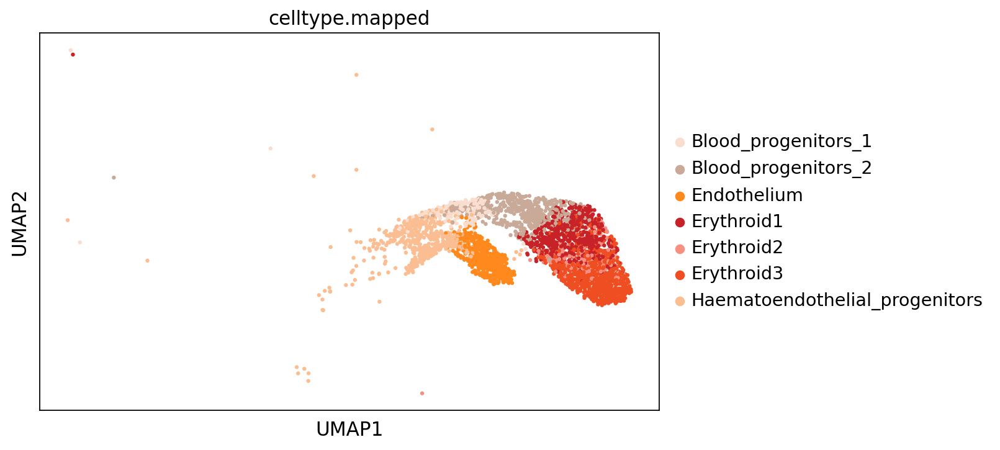

In [104]:
sc.pl.umap(blood_copy, color = "celltype.mapped", save = "Blood_lineage_umap.pdf")
plt.show()
#plt.savefig(plot_dir + "Blood_lineage_umap.pdf", format="pdf", bbox_inches="tight")

In [30]:
blood_copy.X = blood_copy.layers["counts"]

In [ ]:
#sc.pp.normalize_total(blood_copy, target_sum=1e4)
#sc.pp.log1p(blood_copy)
#sc.tl.pca(blood_copy, svd_solver='arpack')
#sc.pp.neighbors(blood_copy, n_pcs=20, knn=True, n_neighbors=15, method="umap")
#sc.tl.leiden(blood_copy,resolution =.5)
#sc.tl.paga(blood_copy)
#sc.pl.paga(blood_copy, plot=False)
#sc.tl.umap(blood_copy, init_pos="paga")
#sc.pl.umap(blood_copy, color = "celltype.mapped", size = 10, title = "only blood lineage")

Add raw counts to X slot for blood cellls. This is necessary, because the data will be normalized again in UniTVelo

In [31]:
blood.X = blood.layers["counts"]

In [ ]:
#sc.write("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/blood_lineage_counts.h5ad",blood)

# ScVelo

In [ ]:
adata =  sc.read_h5ad("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/blood_lineage.h5ad")
adata.X = adata.layers["counts"]

In [ ]:
label = "celltype.mapped"

In [ ]:
title = 'scVelo stochastic mode'
scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

scv.tl.velocity(adata, mode='stochastic')

scv.tl.velocity_graph(adata)
scv.pl.velocity_embedding_stream(adata, color=label, dpi = 100, title=title)

In [ ]:
scv.pl.velocity_embedding_grid(adata, basis='umap', color = label, dpi = 100)

In [ ]:
scv.pl.velocity_embedding(adata, basis='umap', color = label, dpi = 100)

In [ ]:
cluster_edges = [("Haematoendothelial_progenitors", "Blood_progenitors_1"),
                  ("Haematoendothelial_progenitors", "Endothelium"),
    ("Blood_progenitors_1", "Blood_progenitors_2"), 
    ("Blood_progenitors_2", "Erythroid1"),
    ("Erythroid1", "Erythroid2"), 
    ("Erythroid2", "Erythroid3")]

In [ ]:
exp_metrics = {}

In [ ]:
scv.pp.neighbors(adata)
adata_velo = adata[:, adata.var.loc[adata.var['velocity_genes'] == True].index]
exp_metrics["model_sto"] = utv.evaluate(adata_velo, cluster_edges, label, 'velocity')

### Create a PCA for only blood cells
Is it wise to do this or should I create a pca for the entire anndata object first?

In [ ]:
#adata = blood
#scv.pp.filter_and_normalize(adata, min_shared_counts=20, n_top_genes=2000)
#scv.pp.moments(adata, n_pcs=30, n_neighbors=30)

#scv.tl.velocity(adata, mode='stochastic')

#scv.tl.velocity_graph(adata)
#scv.pl.velocity_embedding_stream(adata, color=label, dpi=100, title=title)

In [ ]:
#sc.tl.pca(adata, svd_solver='arpack')


# UniTVelo

In [ ]:
#adata = utv.run_model("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/blood_lineage.h5ad", label, config_file=velo_config)

In [32]:
velo_config = utv.config.Configuration()
velo_config.R2_ADJUST = True
velo_config.IROOT = None
velo_config.FIT_OPTION = '1'
velo_config.GPU = -1

In [46]:
label = "celltype.mapped"

In [33]:
adata = sc.read_h5ad("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/UniTVelo/unitvelo_adata.h5ad")

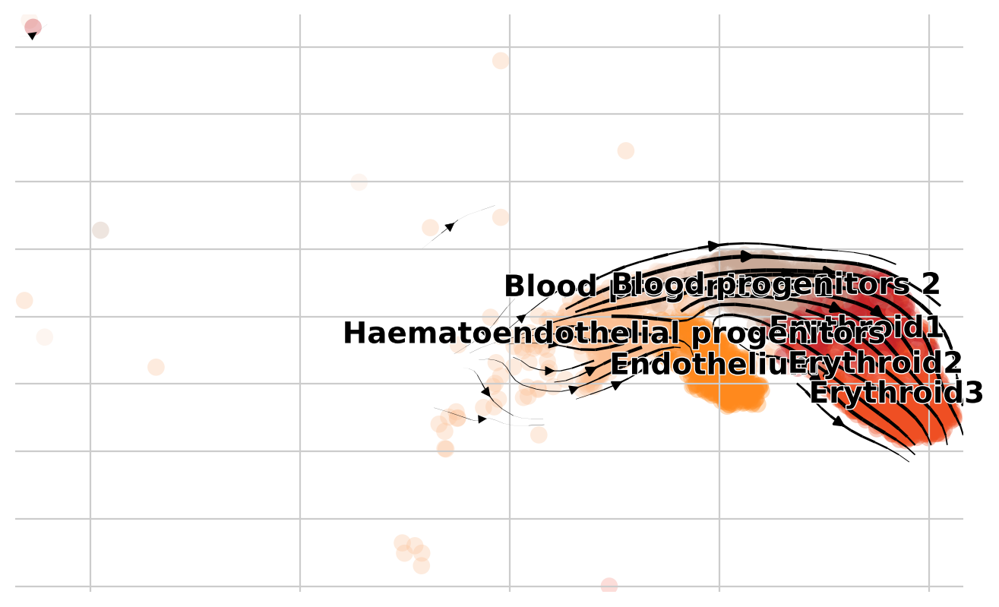

In [123]:
scv.pl.velocity_embedding_stream(adata, color=adata.uns['label'], dpi=100, title='', save = plot_dir + "rna_velocity_unitvelo.pdf")
#plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/rna_velocity_unitvelo.pdf", format="pdf", bbox_inches="tight")


In [ ]:
sc.set_figure_params(figsize=(8,5))
sc.pl.umap(blood, color = "sample", size = 10, save =  "rna_velocity_samples_unitvelo.pdf")
#plt.savefig(plot_dir  + "rna_velocity_samples_unitvelo.pdf", format="pdf", bbox_inches="tight")


Why do the Endothelium cells get a lower latent time? Does that mean that Endothelium develops early or that the fact that this is a diverging branch is not recovered?

In [111]:
%matplotlib inline

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


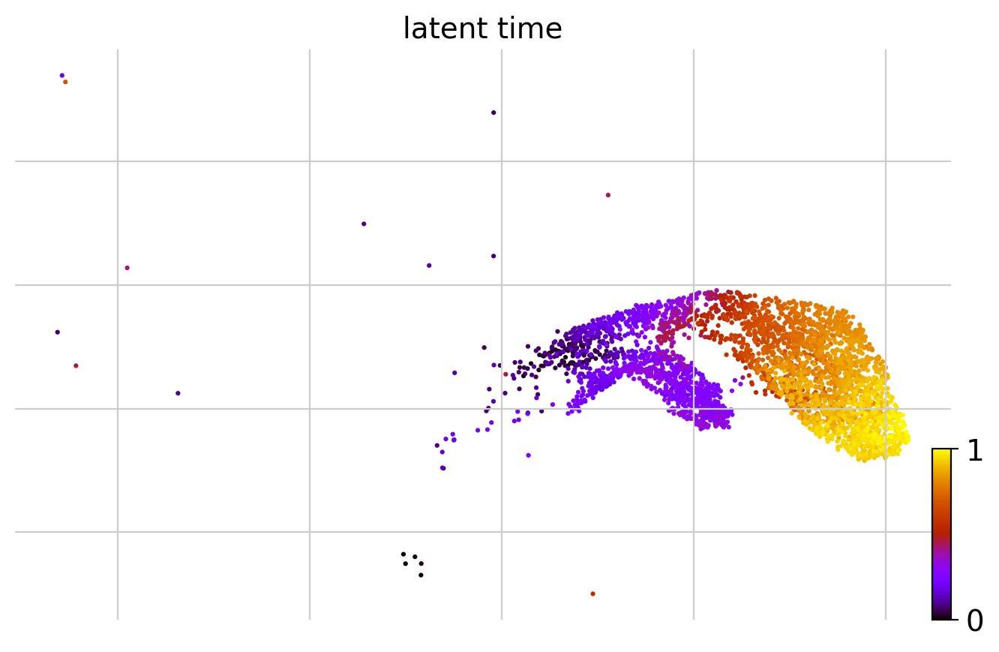

In [116]:
scv.tl.latent_time(adata, min_likelihood=None)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=20, dpi=100, save = plot_dir + "rna_velocity_latent_time_unitvelo.png")
#plt.savefig(plot_dir + "rna_velocity_latent_time_unitvelo.pdf", format="pdf", bbox_inches="tight")


## Further Analysis

In [40]:
subvar = adata.var.loc[adata.var['velocity_genes'] == True]
sub = adata[:, subvar.index]

Distribution of peak time of each gene. A large proportion of gene's activity is inhibited during differentiation. 

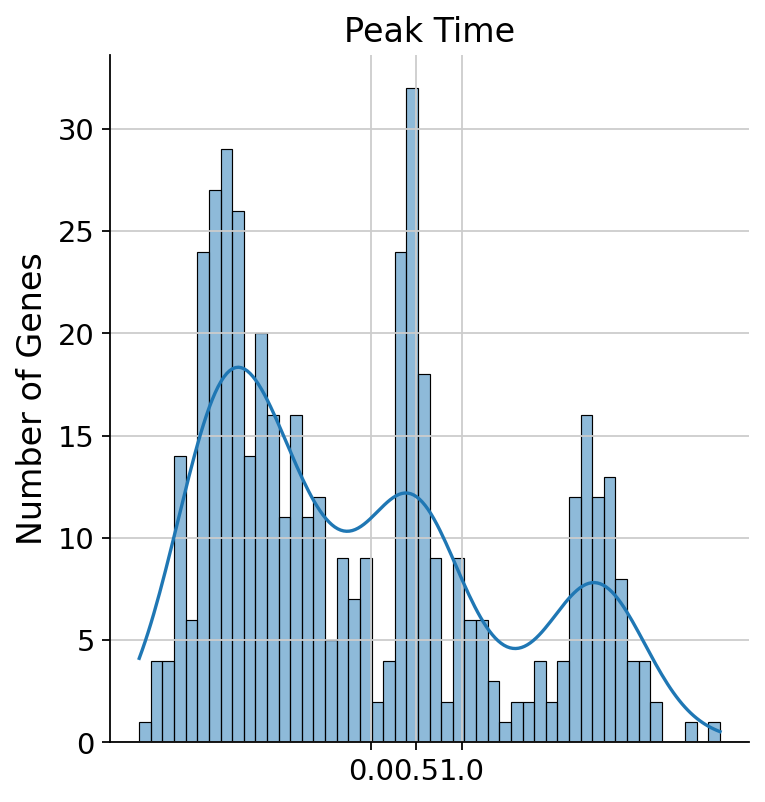

In [42]:
sns.displot(sub.var['fit_t0'].values, kde=True, bins=50)
plt.xticks([0, 0.5, 1], fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel('Number of Genes', fontsize=15)
plt.title('Peak Time', fontsize=15)

plt.savefig(plot_dir + "peak_time.pdf", format="pdf", bbox_inches="tight")


## Time when gene g reaches its highest expression

This is denoted by $\tau_g$ and indicates the profile pattern of each gene in a predefined time window. If $\tau_g < 0$, this suggests a repression pattern. A smaller set of genes have $0 < \tau_g <1$ for transient patterns or $\tau_g > 1$ for induction patterns. Induction genes tend to be active at the end of cellular processes while repression genes are active at the beginning of cellular processes.  

The heatmaps show the separation betweeen induction/repression and transient genes along pseudotime. However, here the interpretation is a bit tricky, since Endothelium cells are actually also a terminal state and here it looks like they are an intermediate state, which means they are probably not captured very well by the model as a bifurcation of lineage differentiation

### Repression genes

In [ ]:
gene = sub.var.loc[sub.var['fit_t0'] < 0.05].index # repression gene
scv.pl.heatmap(
    adata, var_names=gene, sortby='latent_time', yticklabels=False,
    col_color=label, n_convolve=100)

In [ ]:
gene = sub.var.loc[sub.var['fit_t0'] < 0.05].index # repression gene
scv.pl.heatmap(
    adata[adata.obs["celltype.mapped"].isin(["Blood_progenitors_1", "Blood_progenitors_2", "Erythroid1", "Erythroid2", "Erythroid3", "Haematoendothelial_progenitors"]), :], var_names=gene, sortby='latent_time', yticklabels=False,
    col_color=label, n_convolve=100)

In [ ]:
gene = sub.var.loc[sub.var['fit_t0'] < 0.05].index # repression gene
scv.pl.heatmap(
    adata[adata.obs["celltype.mapped"].isin(["Haematoendothelial_progenitors", "Endothelium"]), :], var_names=gene, sortby='latent_time', yticklabels=False,
    col_color=label, n_convolve=100)

## Induction genes

In [ ]:
gene = sub.var.loc[sub.var['fit_t0'] > 0.95].index # induction gene
scv.pl.heatmap(
    adata, var_names=gene, sortby='latent_time', yticklabels=False,
    col_color=label, n_convolve=100)

In [ ]:
gene = sub.var.loc[sub.var['fit_t0'] > 0.95].index # repression gene
scv.pl.heatmap(
    adata[adata.obs["celltype.mapped"].isin(["Blood_progenitors_1", "Blood_progenitors_2", "Erythroid1", "Erythroid2", "Erythroid3", "Haematoendothelial_progenitors"]), :], var_names=gene, sortby='latent_time', yticklabels=False,
    col_color=label, n_convolve=100)

## Transient Genes

In [ ]:
gene = sub.var.loc[(sub.var['fit_t0'] > 0.05) & (sub.var['fit_t0'] < 0.95)].index # transient gene
scv.pl.heatmap(
    adata, var_names=gene, sortby='latent_time', yticklabels=False,
    col_color=label, n_convolve=100) # if you set n_convolve -> data is smoothed along the x-axis with kernel of size n_convolve

# Cell Rank

## Terminal States and Absorption probabilities

In [47]:
cr.tl.terminal_states(adata, cluster_key=label, weight_connectivities=0.2)
cr.pl.terminal_states(adata, dpi = 100, save = plot_dir + "terminal_states_blood.pdf")

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.terminal_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/cellrank/tl/_init_term_states.py:161: DeprecationWarning: `cellrank.tl.transition_matrix` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  **kwargs,


  0%|          | 0/3617 [00:00<?, ?cell/s]

  0%|          | 0/3617 [00:00<?, ?cell/s]

Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000004e+00 -1.9409144567621049e-03 
0.0000000000000000e+00 9.9703257295087366e-01 


## Why are endothelium cells also marked as initial cells?

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.initial_states` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.


Mat Object: 1 MPI processes
  type: seqdense
1.0000000000000064e+00 6.8674326364842019e-03 
0.0000000000000000e+00 9.8219405018955575e-01 


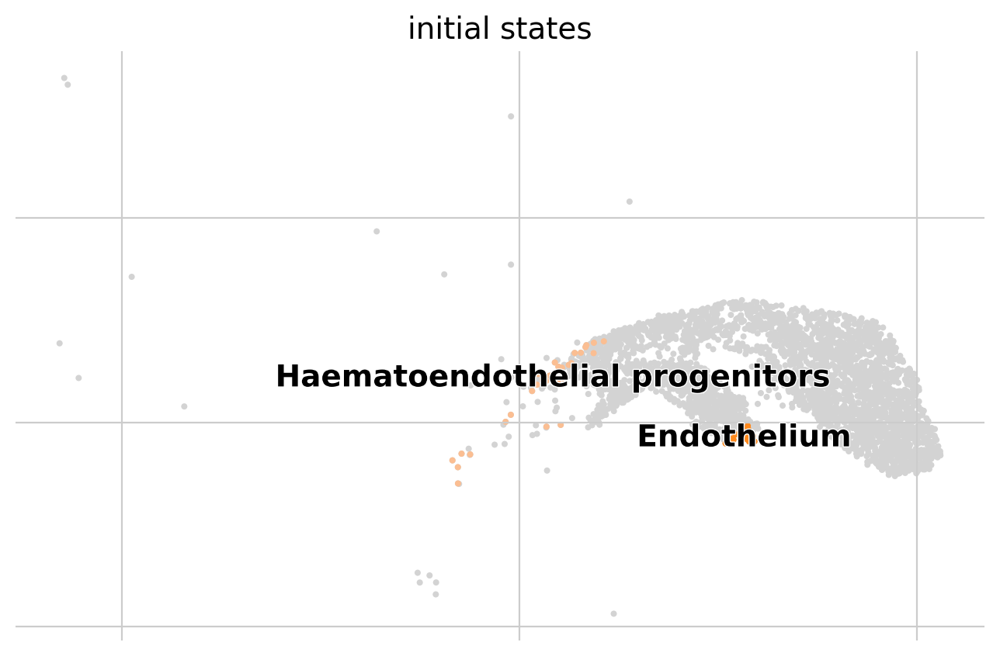

In [53]:
cr.tl.initial_states(adata, cluster_key=label)
cr.pl.initial_states(adata, discrete=True, dpi = 100, save = plot_dir + "initial_state.pdf")

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: `cellrank.tl.lineages` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  """Entry point for launching an IPython kernel.


  0%|          | 0/2 [00:00<?, ?/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/scvelo/plotting/utils.py:866: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = pl.colorbar(smp, orientation=orientation, cax=cax)


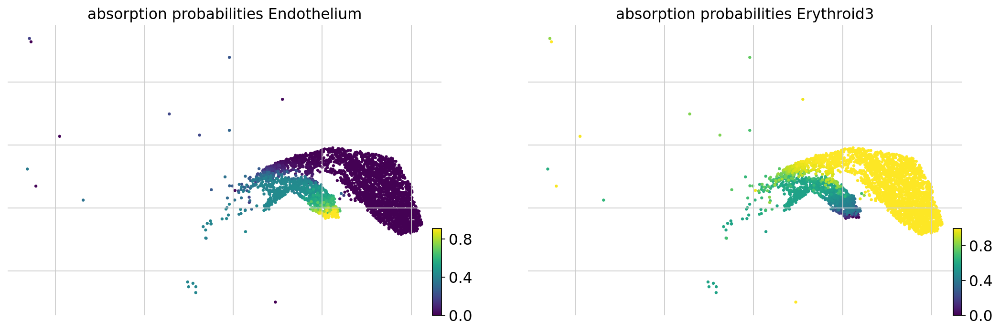

In [57]:
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False, save = plot_dir + "absorption_prob_blood.pdf")

In [58]:
#sc.tl.paga(adata, "celltype.mapped")

cr.tl.lineage_drivers(adata)

#cr.pl.lineage_drivers(adata, lineage="Erythroid3", n_genes=5)


/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/ipykernel_launcher.py:3: DeprecationWarning: `cellrank.tl.lineage_drivers` will be removed in version `2.0`. Please use the `cellrank.kernels` or `cellrank.estimators` interface instead.
  This is separate from the ipykernel package so we can avoid doing imports until


,Endothelium_corr,Endothelium_pval,Endothelium_qval,Endothelium_ci_low,Endothelium_ci_high,Erythroid3_corr,Erythroid3_pval,Erythroid3_qval,Erythroid3_ci_low,Erythroid3_ci_high
Serpinh1,0.771044,0.000000e+00,0.000000e+00,0.757488,0.783935,-0.771044,0.000000e+00,0.000000e+00,-0.783935,-0.757487
Ramp2,0.730169,0.000000e+00,0.000000e+00,0.714583,0.745031,-0.730169,0.000000e+00,0.000000e+00,-0.745031,-0.714583
Adgrf5,0.724783,0.000000e+00,0.000000e+00,0.708938,0.739897,-0.724783,0.000000e+00,0.000000e+00,-0.739897,-0.708938
Col4a1,0.718111,0.000000e+00,0.000000e+00,0.701948,0.733534,-0.718111,0.000000e+00,0.000000e+00,-0.733535,-0.701948
Plvap,0.707337,0.000000e+00,0.000000e+00,0.690668,0.723255,-0.707337,0.000000e+00,0.000000e+00,-0.723255,-0.690667
...,...,...,...,...,...,...,...,...,...,...
Ell2,-0.397754,2.622918e-141,1.277615e-140,-0.424838,-0.369959,0.397755,2.621741e-141,1.277042e-140,0.369959,0.424839
Slc16a10,-0.404205,1.929549e-146,9.647747e-146,-0.431117,-0.376575,0.404205,1.929401e-146,9.647004e-146,0.376575,0.431117
Gse1,-0.408700,4.316581e-150,2.202040e-149,-0.435490,-0.381186,0.408699,4.319620e-150,2.203590e-149,0.381185,0.435490
Snca,-0.430854,5.233213e-169,3.111083e-168,-0.457027,-0.403935,0.430854,5.234317e-169,3.111740e-168,0.403934,0.457027


In [ ]:
#cr.pl.lineage_drivers(adata, lineage="Erythroid3", n_genes=5)


### Gene expression heatmaps

  0%|          | 0/17 [00:00<?, ?gene/s]

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the 

,Endothelium
0,Etv2
1,Hba-a2
2,Runx1
3,Gata1
4,Krt8
5,Gata2
6,Tal1
7,Igf2
8,Kdr
9,Apoe


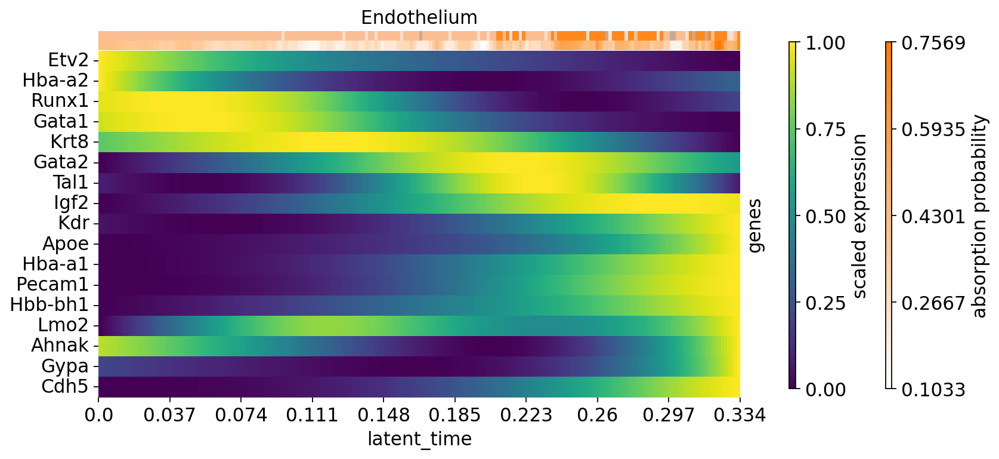

In [89]:
model = cr.ul.models.GAM(adata)

cr.pl.heatmap(
    adata,
    model,
    ["Gata1", "Gata2", "Etv2", "Tal1", "Runx1",  "Ahnak", "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa", "Apoe", "Igf2", "Krt8", "Kdr", "Pecam1", "Cdh5"],
    time_key="latent_time",
    cluster_key="celltype.mapped",
    scale=True,
    lineages=["Endothelium"],
    show_absorption_probabilities=True,
    show_progress_bar=False,
    return_genes=True,
    mode="lineages",
    figsize=(10, 5),
    show_all_genes = True,
    save = plot_dir + "heatmap_gene_expression_endothelium.pdf" 
)


#plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/heatmap_gene_expression_erythroid_endothelium.pdf", format="pdf", bbox_inches="tight")


  0%|          | 0/15 [00:00<?, ?gene/s]

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the 

,Erythroid3
0,Krt8
1,Gata2
2,Etv2
3,Kdr
4,Cdh5
5,Pecam1
6,Apoe
7,Runx1
8,Lmo2
9,Ahnak


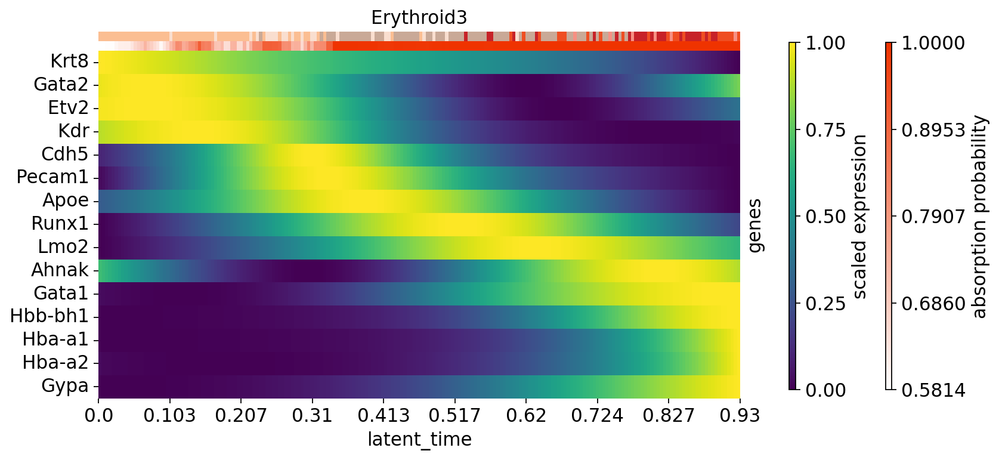

In [99]:
model = cr.ul.models.GAM(adata)

cr.pl.heatmap(
    adata[adata.obs["celltype.mapped"].isin(["Blood_progenitors_1", "Blood_progenitors_2", "Erythroid1", "Erythroid2", "Erythroid3", "Haematoendothelial_progenitors"])],
    model,
    #["Gata1", "Gata2", "Runx1",  "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa", "Apoe", "Kdr", "Pecam1", "Cdh5"],
    ["Gata1", "Gata2", "Etv2", "Runx1",  "Ahnak", "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa", "Apoe", "Krt8", "Kdr", "Pecam1", "Cdh5"],
    time_key="latent_time",
    cluster_key="celltype.mapped",
    scale=True,
    lineages=["Erythroid3"],#, "Endothelium"],
    show_absorption_probabilities=True,
    show_progress_bar=False,
    return_genes=True,
    mode="lineages",
    figsize=(10, 5),
    show_all_genes = True,
    save = plot_dir + "heatmap_gene_expression_erythroid.pdf"
)


#plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/heatmap_gene_expression_erythroid.pdf", format="pdf", bbox_inches="tight")


### Gene expression trends

  0%|          | 0/19 [00:00<?, ?gene/s]

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the 

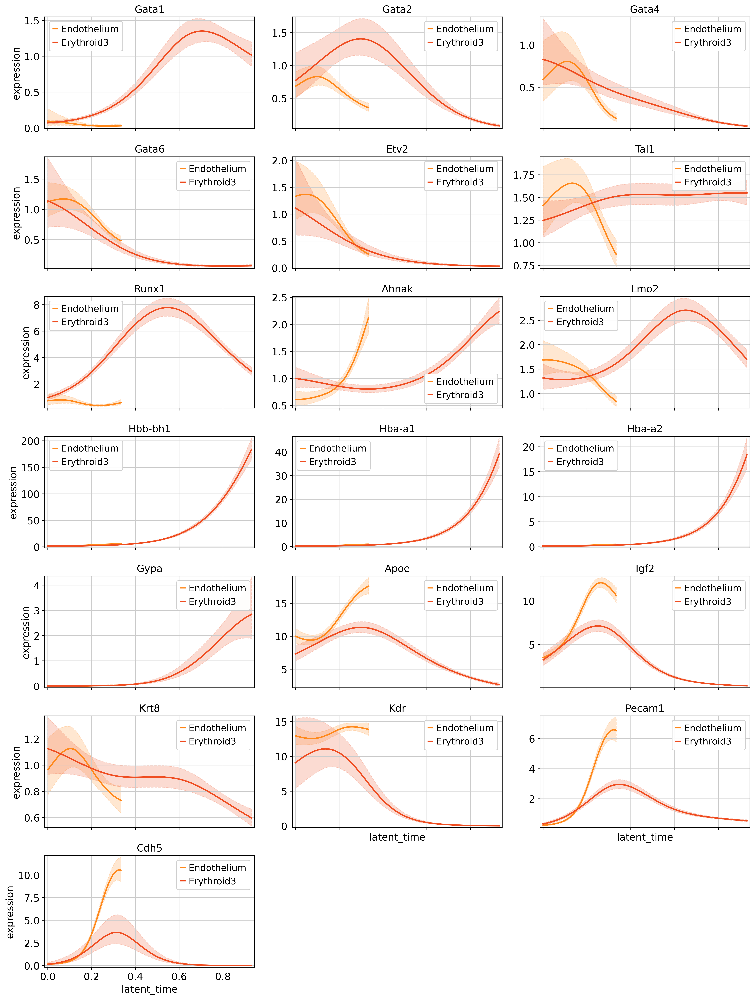

In [65]:
model = cr.ul.models.GAM(adata)
test = cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1",  "Ahnak", "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa"
, "Apoe", "Igf2", "Krt8", "Kdr", "Pecam1", "Cdh5"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    #cell_color="celltype.mapped",
    figsize=(15, 20),
    n_test_points=200,
    dpi = 200,
    return_models=True,
    save = plot_dir + "gene_expression_pseudotime_models.pdf"
)

#plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/gene_expression_pseudotime_models.pdf", format="pdf", bbox_inches="tight")


  0%|          | 0/19 [00:00<?, ?gene/s]

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the 

{'Gata1': {'Endothelium': <GAM[gene='Gata1', lineage='Endothelium', model=GammaGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, max_iter=2000, scale=None, terms=s(0) + intercept, tol=0.0001, verbose=False)]>,
  'Erythroid3': <GAM[gene='Gata1', lineage='Erythroid3', model=GammaGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, max_iter=2000, scale=None, terms=s(0) + intercept, tol=0.0001, verbose=False)]>},
 'Gata2': {'Endothelium': <GAM[gene='Gata2', lineage='Endothelium', model=GammaGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, max_iter=2000, scale=None, terms=s(0) + intercept, tol=0.0001, verbose=False)]>,
  'Erythroid3': <GAM[gene='Gata2', lineage='Erythroid3', model=GammaGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, max_iter=2000, scale=None, terms=s(0) + intercept, tol=0.0001, verbose=False)]>},
 'Gata4': {'Endothelium': <GAM[gene='Gata4', lineage='Endothelium', model=GammaGAM(callbacks=[Deviance(), Diffs()], fit_intercept=True, max_iter=2000, s

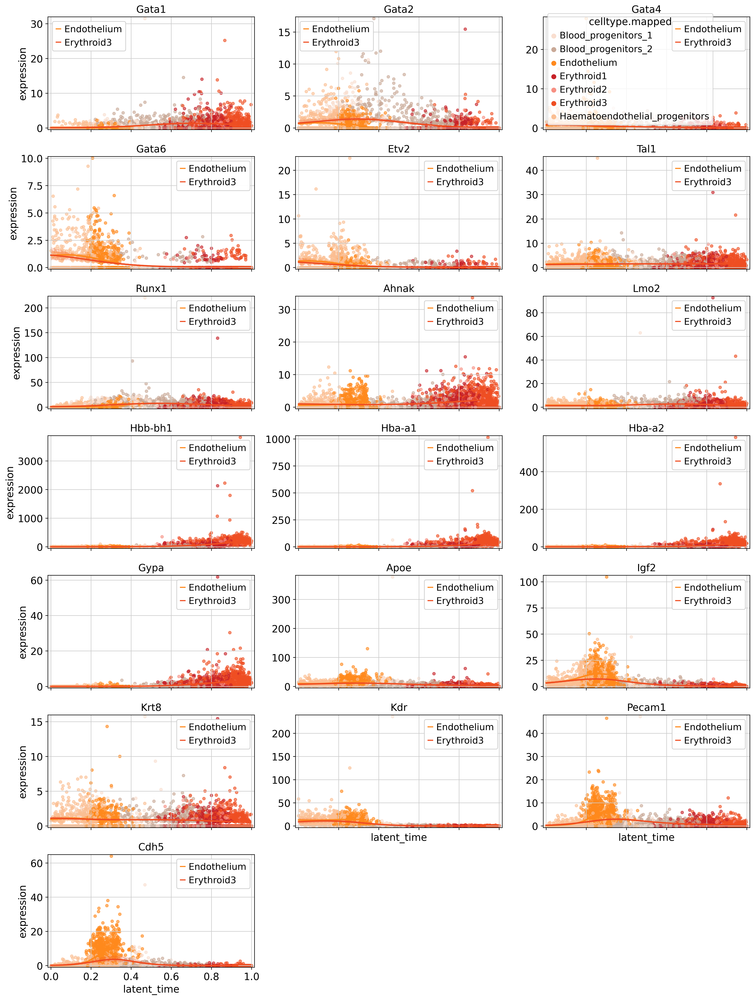

In [66]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1",  "Ahnak", "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa"
, "Apoe", "Igf2", "Krt8", "Kdr", "Pecam1", "Cdh5"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=False,
    cell_color="celltype.mapped",
    figsize=(15, 20),
    n_test_points=200,
    dpi = 200,
    return_models=True,
    obs_legend_loc="lower",
    save = plot_dir + "gene_expression_pseudotime_models_cells.pdf"
)

#plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/gene_expression_pseudotime_models_cells.pdf", format="pdf", bbox_inches="tight")


In [ ]:
test

### Gene activity scores

In [84]:
scores = pd.read_csv("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/UniTVelo/gene_activity_scores_ArchR",index_col = 0)
scores_copy  = scores.copy()
genes = scores.index[scores.index.isin(adata.var.index.to_list()).tolist()]
cells = adata.obs.index[adata.obs.index.isin(scores.columns)]
scores_adata = adata[:, adata.var["gene"].isin(genes)]
scores_adata = scores_adata[scores_adata.obs.index.isin(cells), :]
scores = scores.loc[genes.tolist(),cells.tolist()]
scores = scores.loc[scores_adata.var_names, scores_adata.obs_names]
scores_adata.X = scores.T
#sc.write("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/blood_lineage_gene_activity_scores.h5ad",scores_adata)

## Why are endothelium cells also marked as initial cells?

  0%|          | 0/16 [00:00<?, ?gene/s]

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the 

,Endothelium
0,Runx1
1,Ahnak
2,Hba-a2
3,Krt8
4,Gata1
5,Gata2
6,Hba-a1
7,Etv2
8,Tal1
9,Lmo2


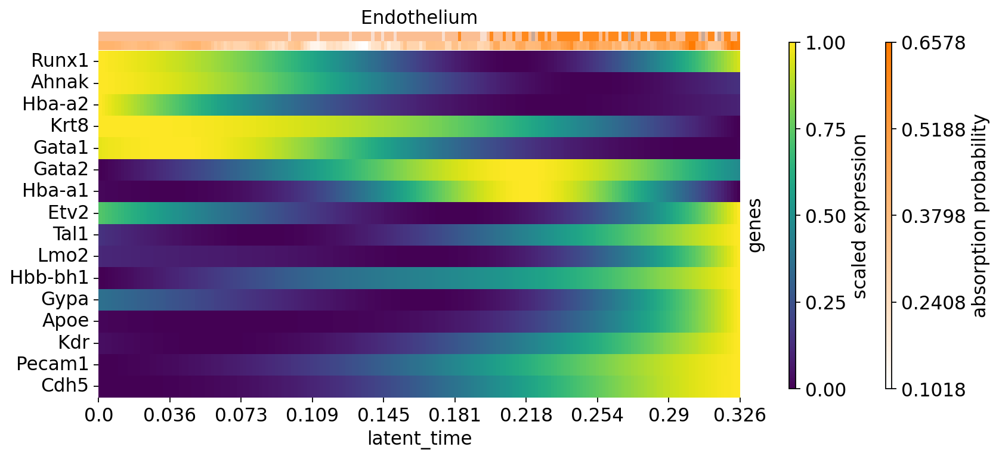

In [85]:
model = cr.ul.models.GAM(scores_adata)

cr.pl.heatmap(
    scores_adata,
    model,
    ["Gata1", "Gata2",  "Etv2", "Tal1", "Runx1",  "Ahnak", "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa", "Apoe", "Krt8", "Kdr", "Pecam1", "Cdh5"],
    time_key="latent_time",
    cluster_key="celltype.mapped",
    lineages=["Endothelium"],
    show_absorption_probabilities=True,
    show_progress_bar=False,
    show_all_genes=True,
    return_genes=True,
    figsize=(10, 5),
    save=plot_dir + "heatmap_gene_activity_endothelium.pdf"
)

#plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/heatmap_gene_activity_erythroid_endothelium.pdf", format="pdf", bbox_inches="tight")




  0%|          | 0/15 [00:00<?, ?gene/s]

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the 

,Erythroid3
0,Krt8
1,Etv2
2,Kdr
3,Cdh5
4,Apoe
5,Pecam1
6,Gata2
7,Ahnak
8,Runx1
9,Gata1


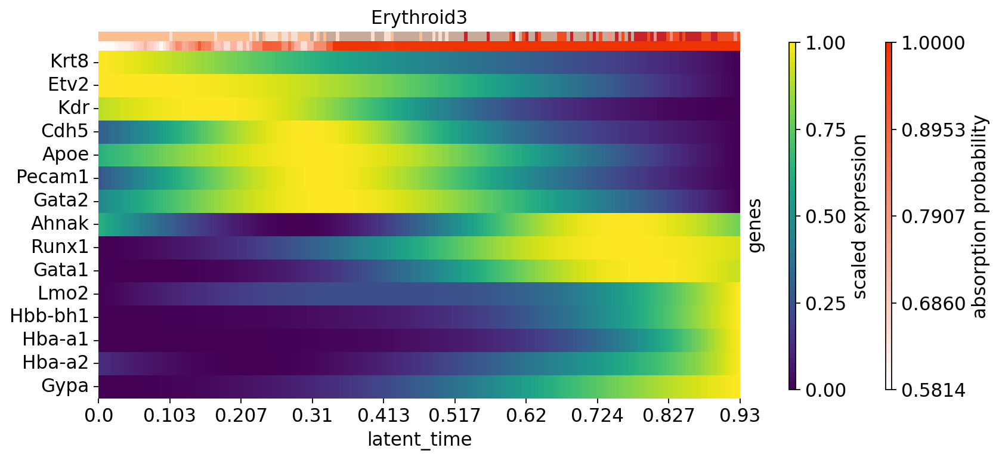

In [95]:
model = cr.ul.models.GAM(scores_adata)

cr.pl.heatmap(
    scores_adata[scores_adata.obs["celltype.mapped"].isin(["Blood_progenitors_1", "Blood_progenitors_2", "Erythroid1", "Erythroid2", "Erythroid3", "Haematoendothelial_progenitors"])],
    model,
    #["Gata1", "Gata2", "Runx1",  "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa", "Apoe", "Kdr", "Pecam1", "Cdh5"],
    ["Gata1", "Gata2", "Etv2", "Runx1",  "Ahnak", "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa", "Apoe", "Krt8", "Kdr", "Pecam1", "Cdh5"],
    time_key="latent_time",
    cluster_key="celltype.mapped",
    lineages=["Erythroid3"],#, "Endothelium"],
    show_absorption_probabilities=True,
    show_progress_bar=False,
    return_genes=True,
    show_all_genes=True,
    save=plot_dir + "heatmap_gene_activity_erythroid.pdf",
    figsize=(10, 5)
)

#plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/heatmap_gene_activity_erythroid.pdf", format="pdf", bbox_inches="tight")




In [ ]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1",  "Ahnak", "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa"
, "Apoe", "Igf2", "Krt8", "Kdr", "Pecam1", "Cdh5"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=False,
    cell_color="celltype.mapped",
    figsize=(15, 20),
    n_test_points=200,
    dpi = 200,
    return_models=True,
    obs_legend_loc="lower"
)

plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/gene_activity_pseudotime_models_cells.pdf", format="pdf", bbox_inches="tight")


In [ ]:
model = cr.ul.models.GAM(scores_adata)
cr.pl.gene_trends(
    scores_adata,
    model=model,
    data_key="X",
    genes=["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1",  "Ahnak", "Lmo2", "Hbb-bh1", "Hba-a1", "Hba-a2", "Gypa"
, "Apoe", "Igf2", "Krt8", "Kdr", "Pecam1", "Cdh5"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 20),
    n_test_points=200,
)


plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/gene_activity_pseudotime_models.pdf", format="pdf", bbox_inches="tight")


### ChromVar Scores

In [96]:
#chromvar = pd.read_csv("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/UniTVelo/motif_matrix_ChromVar", index_col = 0)
chromvar = pd.read_csv("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/UniTVelo/motif_matrix_ChromVar_pos", index_col = 0)

In [97]:
# gt gene names from chromvar dataframe which are found in the anndata ojbect
genes = chromvar.index[chromvar.index.isin(adata.var.index.to_list()).tolist()]
# get cell names from chromvar dataframe
cells = adata.obs.index[adata.obs.index.isin(chromvar.columns)]

# get a copy of the anndata object filtered for genes which were in the dataframe
chromvar_adata = adata[:, adata.var["gene"].isin(genes)]
# filter for cells
chromvar_adata = chromvar_adata[chromvar_adata.obs.index.isin(cells), :]

# make sure that the order of gene names and cell names in the dataframe fits the anndata object
chromvar = chromvar.loc[genes.tolist(),cells.tolist()]
chromvar = chromvar.loc[chromvar_adata.var_names, chromvar_adata.obs_names]

# add the chromvar dataframe as the X matrix to the anndata object for plotting
chromvar_adata.X = chromvar.T
chromvar_adata.layers["chromvar"] = chromvar.T

In [ ]:
genes = chromvar.index[chromvar.index.isin(adata.var.index.to_list()).tolist()]

In [ ]:
cells = adata.obs.index[adata.obs.index.isin(chromvar.columns)]

In [ ]:
chromvar_adata = adata[:, adata.var["gene"].isin(genes)]

In [ ]:
chromvar_adata = chromvar_adata[chromvar_adata.obs.index.isin(cells), :]

In [ ]:
chromvar = chromvar.loc[genes.tolist(),cells.tolist()]

In [ ]:
chromvar = chromvar.loc[chromvar_adata.var_names, chromvar_adata.obs_names]

In [ ]:
chromvar_adata.X = chromvar.T

In [ ]:
chromvar_adata.shape

In [ ]:
chromvar_adata.layers["chromvar"] = chromvar.T

Etv2, Tal1 -> Hematoendothelial progenitors

Runx1 -> Blood progenitors

Elk3 -> Endothelium

  0%|          | 0/8 [00:00<?, ?gene/s]

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the 

,Endothelium
0,Tal1
1,Gata4
2,Gata1
3,Gata2
4,Gata6
5,Etv2
6,Runx1
7,Elk3


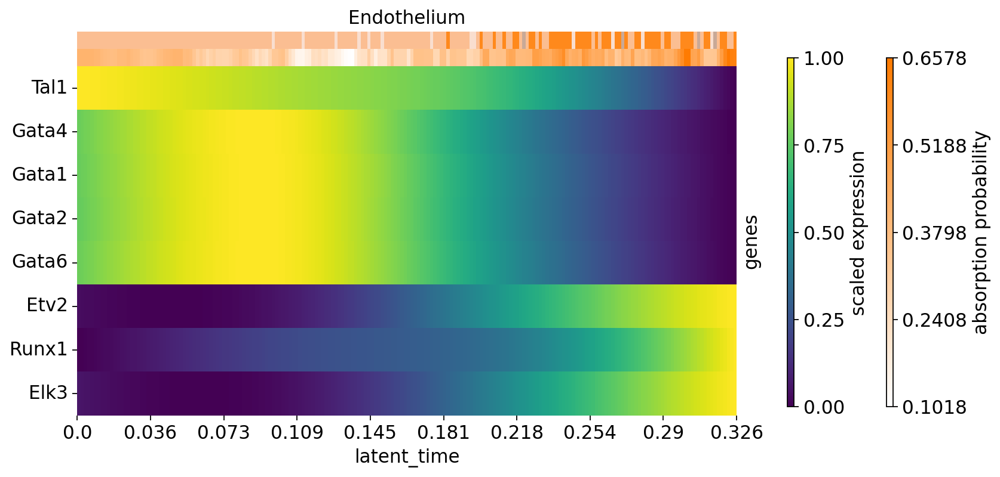

In [101]:
model = cr.ul.models.GAM(chromvar_adata)

cr.pl.heatmap(
    chromvar_adata,
    model,
    ["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1",  "Elk3"],
    time_key="latent_time",
    lineages=[ "Endothelium"],
    cluster_key="celltype.mapped",
    show_absorption_probabilities=True,
    show_progress_bar=False,
    show_all_genes=True,
    return_genes=True,
    figsize=(10, 5),
    save=plot_dir + "chromvar_heatmap_pseudotime_endothelium.pdf"
)

#plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/chromvar_heatmap_pseudotime_endothelium.pdf", format="pdf", bbox_inches="tight")


  0%|          | 0/8 [00:00<?, ?gene/s]

/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:649: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bases = (x >= aug_knots[:-1]).astype(np.int) * \
/omics/groups/OE0533/internal/katharina/unitvelo/lib/python3.7/site-packages/pygam/utils.py:650: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the 

,Erythroid3
0,Tal1
1,Etv2
2,Runx1
3,Gata2
4,Gata1
5,Gata6
6,Gata4
7,Elk3


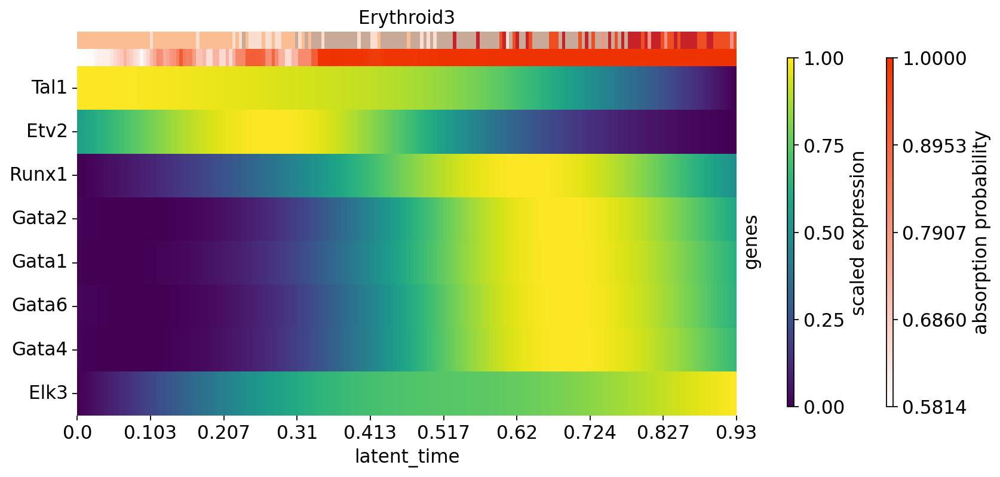

In [103]:
model = cr.ul.models.GAM(chromvar_adata)

cr.pl.heatmap(
    chromvar_adata[chromvar_adata.obs["celltype.mapped"].isin(["Blood_progenitors_1", "Blood_progenitors_2", "Erythroid1", "Erythroid2", "Erythroid3", "Haematoendothelial_progenitors"])],
    model,
    ["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1",  "Elk3"],
    time_key="latent_time",
    lineages=["Erythroid3"],#, "Endothelium"],
    cluster_key="celltype.mapped",
    show_absorption_probabilities=True,
    show_progress_bar=False,
    return_genes=True,
    figsize=(10, 5),
    show_all_genes=True,
    save=plot_dir + "chromvar_heatmap_pseudotime_erythroid.pdf" 
)

#plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/chromvar_heatmap_pseudotime_erythroid.pdf", format="pdf", bbox_inches="tight")


In [ ]:
model = cr.ul.models.GAM(chromvar_adata)
cr.pl.gene_trends(
    chromvar_adata,
    model=model,
    data_key="chromvar",
    genes=["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1",  "Elk3"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 10),
    n_test_points=200,
)


plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/chromvar_pseudotime.pdf", format="pdf", bbox_inches="tight")


In [ ]:
model = cr.ul.models.GAM(chromvar_adata)
cr.pl.gene_trends(
    chromvar_adata,
    model=model,
    data_key="chromvar",
    genes=["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1",  "Elk3"],
    ncols=3,
    time_key="latent_time",
    hide_cells=False,
    cell_color="celltype.mapped",
    same_plot=True,
    figsize=(15, 10),
    n_test_points=200,
)


plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/chromvar_pseudotime_models_cells.pdf", format="pdf", bbox_inches="tight")


# Deep learning ChromVar scores

In [ ]:
chromvar_deep = pd.read_csv("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/UniTVelo/motif_matrix_deep_ChromVar_pos.csv", index_col = 0)

In [ ]:
chromvar_deep

In [ ]:
# gt gene names from chromvar dataframe which are found in the anndata ojbect
genes = chromvar_deep.index[chromvar_deep.index.isin(adata.var.index.to_list()).tolist()]
# get cell names from chromvar dataframe
cells = adata.obs.index[adata.obs.index.isin(chromvar_deep.columns)]

# get a copy of the anndata object filtered for genes which were in the dataframe
chromvar_deep_adata = adata[:, adata.var["gene"].isin(genes)]
# filter for cells
chromvar_deep_adata = chromvar_deep_adata[chromvar_deep_adata.obs.index.isin(cells), :]

In [ ]:
chromvar_deep.columns

In [ ]:
# make sure that the order of gene names and cell names in the dataframe fits the anndata object
chromvar_deep = chromvar_deep.loc[genes.tolist(),cells.tolist()]
chromvar_deep = chromvar_deep.loc[chromvar_deep_adata.var_names, chromvar_deep_adata.obs_names]

# add the chromvar dataframe as the X matrix to the anndata object for plotting
chromvar_deep_adata.X = chromvar_deep.T
chromvar_deep_adata.layers["chromvar"] = chromvar_deep.T

In [ ]:
model = cr.ul.models.GAM(chromvar_deep_adata)

cr.pl.heatmap(
    chromvar_deep_adata,
    model,
    ["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1"],
    time_key="latent_time",
    lineages=["Erythroid3", "Endothelium"],
    cluster_key="celltype.mapped",
    show_absorption_probabilities=True,
    show_progress_bar=False,
    return_genes=True,
    figsize=(10, 5),
)

plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/deep_chromvar_heatmap_pseudotime.pdf", format="pdf", bbox_inches="tight")


In [ ]:
model = cr.ul.models.GAM(chromvar_deep_adata)
cr.pl.gene_trends(
    chromvar_deep_adata,
    model=model,
    data_key="chromvar",
    genes=["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1"],
    ncols=3,
    time_key="latent_time",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 10),
    n_test_points=200,
)


plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/deep_chromvar_pseudotime.pdf", format="pdf", bbox_inches="tight")


In [ ]:
model = cr.ul.models.GAM(chromvar_deep_adata)
cr.pl.gene_trends(
    chromvar_deep_adata,
    model=model,
    data_key="chromvar",
    genes=["Gata1", "Gata2", "Gata4", "Gata6", "Etv2", "Tal1", "Runx1"],
    ncols=3,
    time_key="latent_time",
    hide_cells=False,
    cell_color="celltype.mapped",
    same_plot=True,
    figsize=(15, 10),
    n_test_points=200,
)


plt.savefig("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data_new/Kathi/plots/deep_chromvar_pseudotime_models_cells.pdf", format="pdf", bbox_inches="tight")


## Latent Time - Erythroid lineage

Is the bimodal distribution caused by the endothelial cells which get assigned to an earlier latent time than erythroid cells?

In [ ]:
plt.hist(adata.obs["latent_time_gm"], bins = 200, label="Latent time distribution")

In [ ]:
# momentum
adata.layers["Ms"]

# Brain

### PCA Embedding

In [ ]:
brain = rna[rna.obs["celltype.mapped"].isin(["Forebrain_Midbrain_Hindbrain", "Neural_crest", "Rostral_neurectoderm", "Spinal_cord", "Caudal_neurectoderm", "Surface_ectoderm", "NMP", "Epiblast"]),] 

In [ ]:
brain.obs["celltype.mapped"].unique()

In [ ]:
brain.X = brain.layers["counts"].todense()

In [ ]:
#sc.write("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/brain.h5ad",brain)

brain = sc.read_h5ad("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/brain.h5ad")

### UniTVelo

In [ ]:
velo_config = utv.config.Configuration()
velo_config.R2_ADJUST = True
velo_config.IROOT = None
velo_config.FIT_OPTION = '1'
velo_config.GPU = -1

In [ ]:
#adata = utv.run_model("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/old_data_three_timepoints/brain.h5ad", label, config_file=velo_config)

In [ ]:
#sc.write("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/UniTVelo/brain_unitvelo.h5ad", adata)
adata = sc.read_h5ad("/omics/groups/OE0533/internal/katharina/scDoRI/gastrulation_data/UniTVelo/unitvelo_adata_brain.h5ad")

In [ ]:
scv.pl.velocity_embedding_stream(adata, color=adata.uns['label'], dpi=200, title='')

In [ ]:
sc.set_figure_params(figsize=(15,10))
sc.pl.umap(adata, color = "sample", size = 15)

In [ ]:
sc.set_figure_params(figsize=(8,15))
sns.catplot(x="sample",  kind="count", data=adata.obs)

In [ ]:
scv.tl.latent_time(adata, min_likelihood=None)
scv.pl.scatter(adata, color='latent_time', color_map='gnuplot', size=20, dpi=100)

In [ ]:
subvar = adata.var.loc[adata.var['velocity_genes'] == True]
sub = adata[:, subvar.index]

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.displot(sub.var['fit_t0'].values, kde=True, bins=20)
plt.xticks([0, 0.5, 1], fontsize=13)
plt.yticks(fontsize=13)
plt.ylabel('Number of Genes', fontsize=15)
plt.title('Peak Time', fontsize=15)

In [ ]:
cr.tl.terminal_states(adata, cluster_key=label, weight_connectivities=0.2, n_states = 4)
cr.pl.terminal_states(adata, dpi = 200)

In [ ]:
cr.tl.initial_states(adata, cluster_key=label)
cr.pl.initial_states(adata, discrete=True, dpi = 200)

In [ ]:
cr.tl.lineages(adata)
cr.pl.lineages(adata, same_plot=False, )

In [ ]:
cr.pl.lineages(adata, same_plot=True)

In [ ]:
sc.tl.paga(adata, "celltype.mapped")

cr.tl.lineage_drivers(adata)

cr.pl.lineage_drivers(adata, lineage="Forebrain_Midbrain_Hindbrain_1", n_genes=5)


In [ ]:
model = cr.ul.models.GAM(adata)

cr.pl.gene_trends(
    adata,
    model,
    genes = ["Pax6", "Six3", "Pax2"],
    data_key="Ms",
    time_key="dpt_pseudotime",
    show_progress_bar=False,
)

In [ ]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["Pax6", "Six3", "Pax2"],
    ncols=3,
    time_key="latent_time_gm",
    
    same_plot=True,
    hide_cells=False,
    figsize=(15, 4),
    n_test_points=200,
)

In [ ]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["Pax6", "Six3", "Pax2"],
    ncols=3,
    time_key="latent_time_gm",
    
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200,
)

In [ ]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["Sox10", "Tfap2a", "Pax3", "Sox9"],
    ncols=3,
    time_key="latent_time_gm",
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200,
)

In [ ]:
model = cr.ul.models.GAM(adata)
cr.pl.gene_trends(
    adata,
    model=model,
    data_key="X",
    genes=["Trp63", "Grhl2"],
    ncols=3,
    time_key="latent_time_gm",
    
    same_plot=True,
    hide_cells=True,
    figsize=(15, 4),
    n_test_points=200,
)

## scVI Embedding